In [1]:
import os, sys
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pyvips
import glob
import random
from tqdm import tqdm

# Params
sample_n = 64
regen_order = False
selection_type = 'only_tumor' # 'most_tumor'

# Paths
root = '/media/latlab/MR/projects/kaggle-ubc-ocean'
data_dir = os.path.join(root, 'data')
results_dir = os.path.join(root, 'results')
train_csv = 'train.csv'
train_image_dir = os.path.join(data_dir, 'train_images')
train_thumbnail_dir = os.path.join(data_dir, 'train_thumbnails')
train_mask_dir = os.path.join(data_dir, 'train_masks')
tile_set_name = 'train_tiles_1024_p50_drop60_v6'
tiles_dir = os.path.join(results_dir, tile_set_name)
out_name = tile_set_name + f'_{selection_type}_v2_sample{sample_n}'

# Load data
df = pd.read_csv(os.path.join(data_dir, train_csv))
df

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
...,...,...,...,...,...
533,65022,LGSC,53355,46675,False
534,65094,MC,55042,45080,False
535,65300,HGSC,75860,27503,False
536,65371,HGSC,42551,41800,False


In [2]:
if regen_order:
    # Tumor detect model
    import torch
    from torchvision import models
    from torch import nn
    from torchvision import transforms

    sys.path.append('..')
    from utils import seed_everything

    CFG = {
        'seed': 42,
        'base_model': 'efficientnet_b0',   # resnet18/34/50, efficientnet_b0/b1/b2/b3/b4
        'img_size': 512,
        'batch_size': 32,
        'img_color_mean': [0.8708488980328596, 0.75677901508938, 0.8545134911215124],
        'img_color_std': [0.08086288591996027, 0.11553960008706814, 0.06914169213328555],
    }
    model_name = 'tumor_detect_efficientnet_b0_v2'
    # Label encoder/decoder
    encode = {True: 1}
    decode = {v: k for k, v in encode.items()}

    # Paths
    model_path = os.path.join(results_dir, 'models', 'spec', f'{model_name}.pt')

    seed_everything(CFG['seed'])
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

    transform = transforms.Compose([
        transforms.Resize(CFG['img_size']),
        transforms.ToTensor(),
        transforms.Normalize(mean=CFG['img_color_mean'], std=CFG['img_color_std'])
        ])

    model = models.get_model(CFG['base_model']).to(device)

    # Replace the last fully-connected layer
    if CFG['base_model'].startswith('resnet'):
        model.fc = nn.Linear(in_features=model.fc.in_features, out_features=len(encode)).to(device)
    elif CFG['base_model'].startswith('efficientnet'):
        model.classifier[1] = nn.Linear(in_features=model.classifier[1].in_features, out_features=len(encode), bias=True).to(device)
    elif CFG['base_model'].startswith('convnext'):
        model.classifier[2] = nn.Linear(in_features=model.classifier[2].in_features, out_features=len(encode), bias=True).to(device)
    elif CFG['base_model'].startswith('vit'):
        model.heads.head = nn.Linear(in_features=model.heads.head.in_features, out_features=len(encode), bias=True).to(device)
    elif CFG['base_model'].startswith('swin'):
        model.head = nn.Linear(in_features=model.head.in_features, out_features=len(encode), bias=True).to(device)

    model.load_state_dict(torch.load(model_path))
    model.to(device)
    model.eval();

In [3]:
if regen_order:
    tiles_df = pd.DataFrame(columns=['image_id', 'orig_image_id', 'label', 'orig_image_width', 'orig_image_height', 'is_tma'])
    for i, row in tqdm(df.iterrows(), total=len(df)):
        orig_image_id = row['image_id']

        # Classify if tumor or not
        image_path_list = [p for p in glob.glob(f'{tiles_dir}/{orig_image_id}/*.png')]
        random.shuffle(image_path_list)
        image_id_list = []
        tumor_prob_list = []
        for img_idx, image_path in enumerate(image_path_list):
            if row['is_tma'] == True:
                pred = 1.0   # TMA is always tumor
            else:
                image = Image.open(image_path)
                image = transform(image).unsqueeze_(0)

                with torch.no_grad():
                    inputs = image.to(device, dtype=torch.float)
                    outputs = model(inputs)
                    pred = torch.sigmoid(outputs).item()

            # Save tumor tile to df
            image_id_list += [os.path.splitext(os.path.basename(image_path))[0]]
            tumor_prob_list.append(pred)
        
        curr_df = pd.DataFrame({'image_id': image_id_list, 
                                'orig_image_id': orig_image_id, 
                                'label': row['label'], 
                                'orig_image_width': row['image_width'], 
                                'orig_image_height': row['image_height'], 
                                'is_tma': row['is_tma'],
                                'tumor_prob': tumor_prob_list})
        tiles_df = pd.concat((tiles_df, curr_df))
    tiles_df = tiles_df.reset_index(drop=True)
    tiles_df

In [4]:
if regen_order:
    tiles_df.to_csv(os.path.join(results_dir, f'{tile_set_name}_tumor_prob.csv'), index=False)
else:
    tiles_df = pd.read_csv(os.path.join(results_dir, f'{tile_set_name}_tumor_prob.csv'))

In [5]:
# Get sample from tumor tiles
if selection_type == 'most_tumor':
    tumor_tiles_df = tiles_df.sort_values('tumor_prob', ascending=False).groupby('orig_image_id').head(sample_n).reset_index(drop=True)
elif selection_type == 'only_tumor':
    tumor_tiles_df = tiles_df[tiles_df['tumor_prob'] > 0.5].groupby('orig_image_id').head(sample_n).reset_index(drop=True)
tumor_tiles_df.to_csv(os.path.join(results_dir, f'{out_name}.csv'), index=False)
tumor_tiles_df

,image_id,orig_image_id,label,orig_image_width,orig_image_height,is_tma,tumor_prob
0,000314_2048-13312,4,HGSC,23785,20008,False,0.622129
1,000389_5120-16384,4,HGSC,23785,20008,False,0.927109
2,000077_5120-3072,4,HGSC,23785,20008,False,0.965221
3,000232_16384-9216,4,HGSC,23785,20008,False,0.568714
4,000362_2048-15360,4,HGSC,23785,20008,False,0.887195
...,...,...,...,...,...,...,...
30790,000457_7168-10240,65533,HGSC,45190,33980,False,0.997902
30791,000434_29696-9216,65533,HGSC,45190,33980,False,0.994112
30792,001319_14336-29696,65533,HGSC,45190,33980,False,0.991565
30793,000731_11264-16384,65533,HGSC,45190,33980,False,0.995382


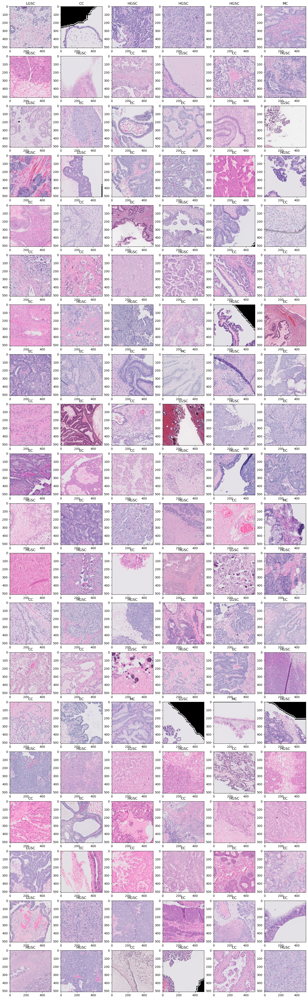

In [6]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tumor_tiles_df.sample(frac=1, ignore_index=True).iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    # img = plt.imread(img_path)
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title(row['label'])
    ax.imshow(img)